In [ ]:
# Install and import necessary libraries
!pip install matplotlib
!pip install numpy
!pip install seaborn
!pip install pandas
from matplotlib.ticker import MultipleLocator
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

In [ ]:
# Importing the data
data = pd.read_csv('Micro_Climate.csv')

# Looking at the first 4 rows of the dataset
data.head(3)

,EnqueuedTimeUtc,deviceId,humidity,temparature,irTemparature
0,16/02/2023 13:41:57,290EC1B,83,14,10
1,16/02/2023 13:41:57,290EF53,83,14,12
2,16/02/2023 13:41:58,290F190,88,13,12


In [ ]:
# Creating a dataframe of 'Micro_Climate' dataset
df = pd.DataFrame(data)

# Changing date time into proper format for easy manipulation of data
df['EnqueuedTimeUtc'] = pd.to_datetime(df['EnqueuedTimeUtc'], format='%d/%m/%Y %H:%M:%S')

# Checking the first three rows of dataset to ensure date time format is changed
df.head(3)

,EnqueuedTimeUtc,deviceId,humidity,temparature,irTemparature
0,2023-02-16 13:41:57,290EC1B,83,14,10
1,2023-02-16 13:41:57,290EF53,83,14,12
2,2023-02-16 13:41:58,290F190,88,13,12


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371079 entries, 0 to 371078
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   EnqueuedTimeUtc  371079 non-null  datetime64[ns]
 1   deviceId         371079 non-null  object        
 2   humidity         371079 non-null  int64         
 3   temparature      371079 non-null  int64         
 4   irTemparature    371079 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 14.2+ MB


In [ ]:
# Check the devices
unique_device = list(set(df.deviceId))
print(f'There are total {len(unique_device)} devices')
unique_device

There are total 14 devices


['2908E30',
 '2909467',
 '290EF53',
 '290EC1B',
 '2908FDA',
 '290ED74',
 '290F190',
 '290F362',
 '290F39C',
 '2909460',
 '290EAD5',
 '290940C',
 '2908E26',
 '2908BE4']

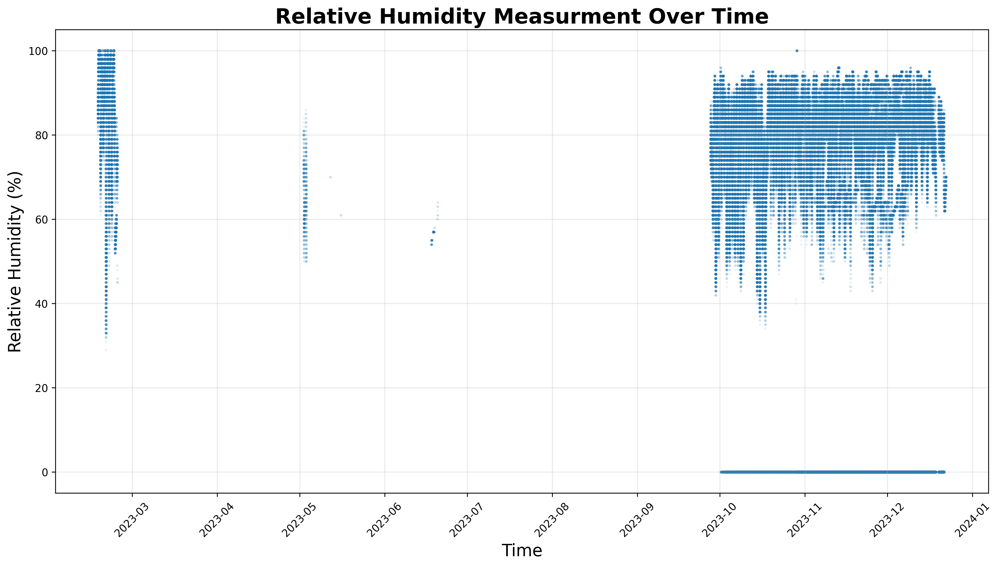

In [ ]:
# Humidity measurment over time
plt.figure(figsize = (16,8), dpi=300)
plt.scatter(x=df.EnqueuedTimeUtc, y= df.humidity,s =3, alpha = 0.05)
plt.title('Relative Humidity Measurment Over Time', fontsize = 20, weight = 'bold' )
plt.xticks(rotation=45)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Relative Humidity (%)', fontsize = 16)
plt.grid(alpha=0.3)
plt.savefig('01_Humidity Measurment Over Time', dpi = 300, pad_inches=0)
plt.show();

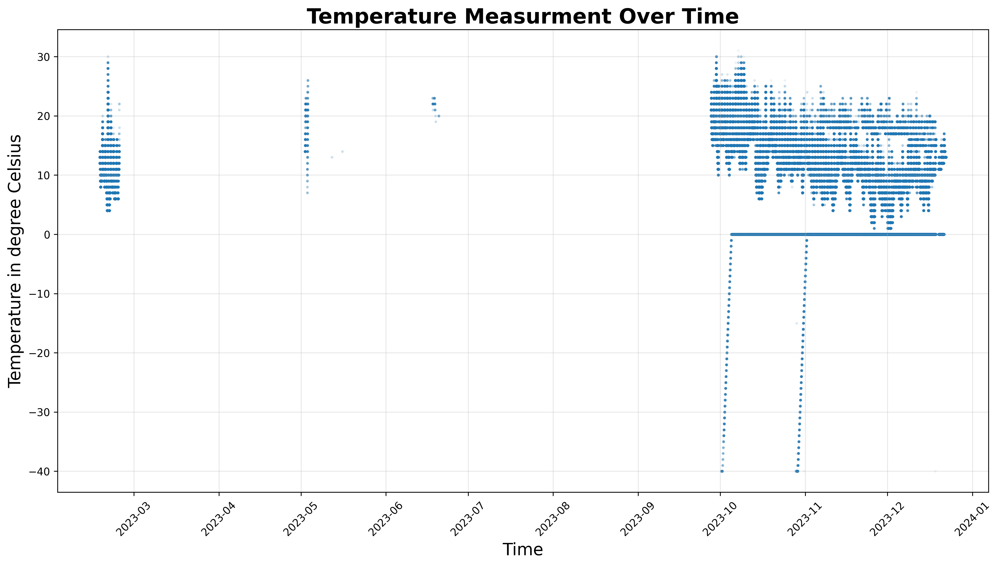

In [ ]:
# Temperature measurment over time
plt.figure(figsize = (16,8), dpi=300)
plt.scatter(x=df.EnqueuedTimeUtc, y= df.temparature,s =3, alpha = 0.05)
plt.title('Temperature Measurment Over Time', fontsize = 20, weight = 'bold' )
plt.xticks(rotation=45)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Temperature in degree Celsius', fontsize = 16)
plt.grid(alpha=0.3)
plt.savefig('02_Temperature Measurment Over Time', dpi = 300, pad_inches=0)
plt.show();

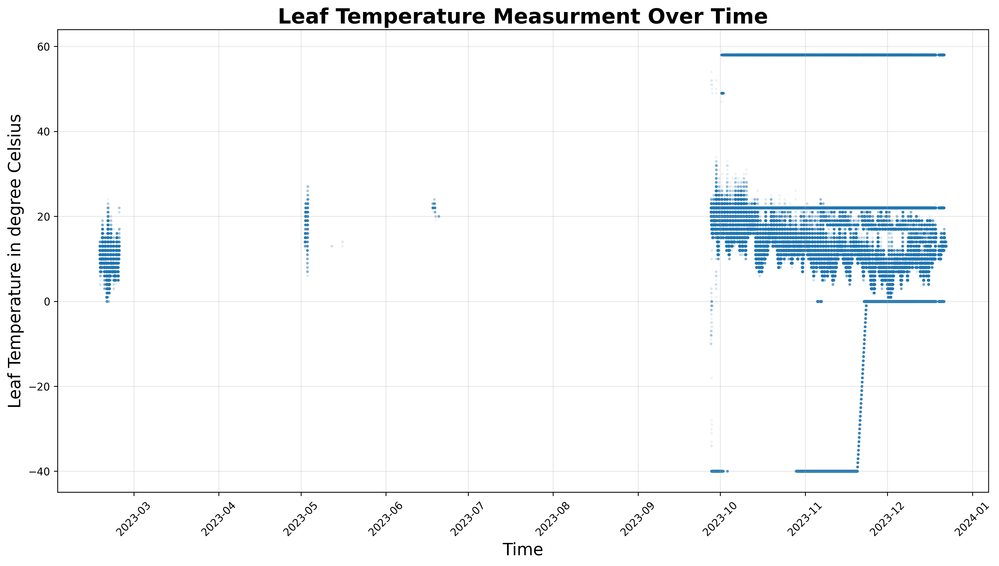

In [ ]:
# Leaf Temperature measurment over time
plt.figure(figsize = (16,8), dpi=300)
plt.scatter(x=df.EnqueuedTimeUtc, y= df.irTemparature,s =3, alpha = 0.05)
plt.title('Leaf Temperature Measurment Over Time', fontsize = 20, weight = 'bold' )
plt.xticks(rotation=45)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Leaf Temperature in degree Celsius', fontsize = 16)
plt.grid(alpha=0.3)
plt.savefig('03_Leaf Temperature Measurment Over Time', dpi = 300, pad_inches=0)
plt.show();

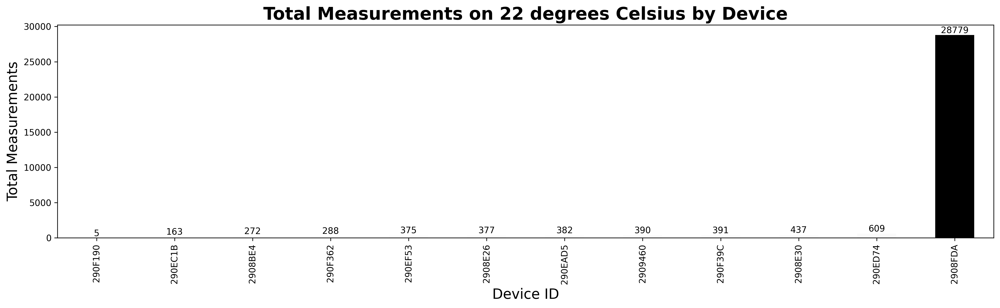

In [ ]:
# Measurment on 22 degrees by devices
ir_temp = df[(df['irTemparature']==22)]
df_device_measurements = ir_temp.groupby('deviceId').size().sort_values()
color_map_df = plt.cm.gray_r(df_device_measurements / df_device_measurements.max())
plt.figure(figsize=(16, 5), dpi=300)
df_device_measurements.plot(kind='bar', color=color_map_df)
plt.title('Total Measurements on 22 degrees Celsius by Device', fontsize=20, weight='bold')
plt.xlabel('Device ID', fontsize=16)
plt.ylabel('Total Measurements', fontsize=16)
for index, value in enumerate(df_device_measurements):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.tight_layout()
plt.savefig('04_Total Measurements on 22 degrees Celsius by Device', dpi = 300, pad_inches = 0)
plt.show();

The mean of relative humidity is: 70.233 and the standard deviation of humidity is: 27.817
The range of relative humidity is: 100


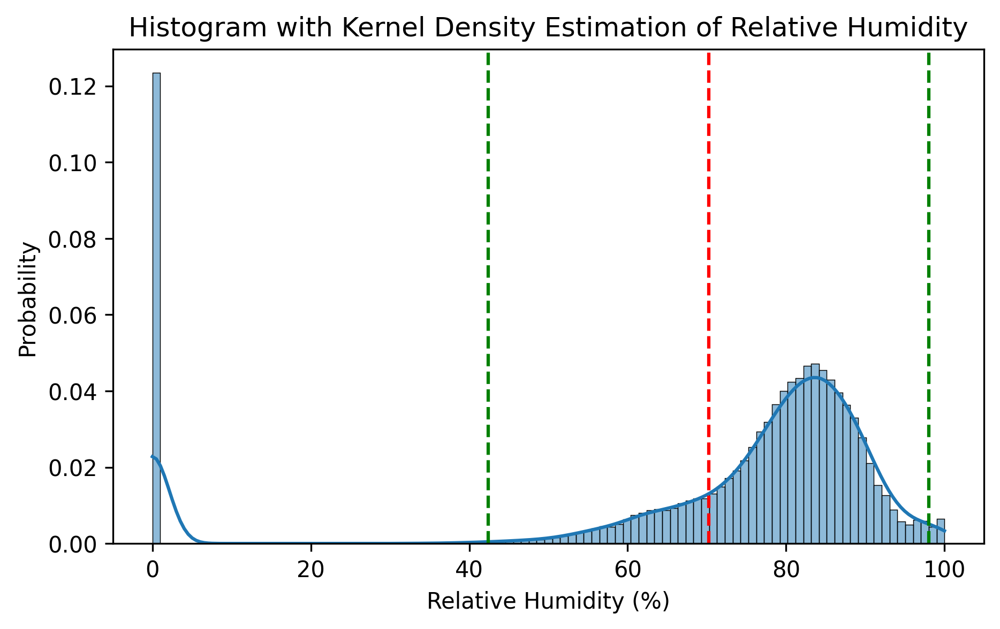

In [ ]:
# Histogram and KDE of humidity
mean_humidity = df.humidity.mean()
sd_humidity = df.humidity.std()
range_humidity = max(df.humidity)-min(df.humidity)
print(f'The mean of relative humidity is: {round(mean_humidity,3)} and the standard deviation of humidity is: {round(sd_humidity,3)}')
print(f'The range of relative humidity is: {range_humidity}')
plt.figure(figsize = (7,4), dpi=300)
sns.histplot(df['humidity'], kde=True, bins = 101,  stat='density')
plt.axvline(mean_humidity, color='r', linestyle='--', label='Mean')
plt.axvline(mean_humidity - sd_humidity, color='g', linestyle='--', label='Mean - SD')
plt.axvline(mean_humidity + sd_humidity, color='g', linestyle='--', label='Mean + SD')
plt.ylabel('Probability')
plt.xlabel('Relative Humidity (%)')
plt.title('Histogram with Kernel Density Estimation of Relative Humidity')
plt.savefig('05_Histogram with Kernel Density Estimation of Humidity', dpi = 300, pad_inches=0)
plt.show();

The mean of temperature is: 10.857 and the standard deviation of temperature is: 6.505
The range of temperature is: 71


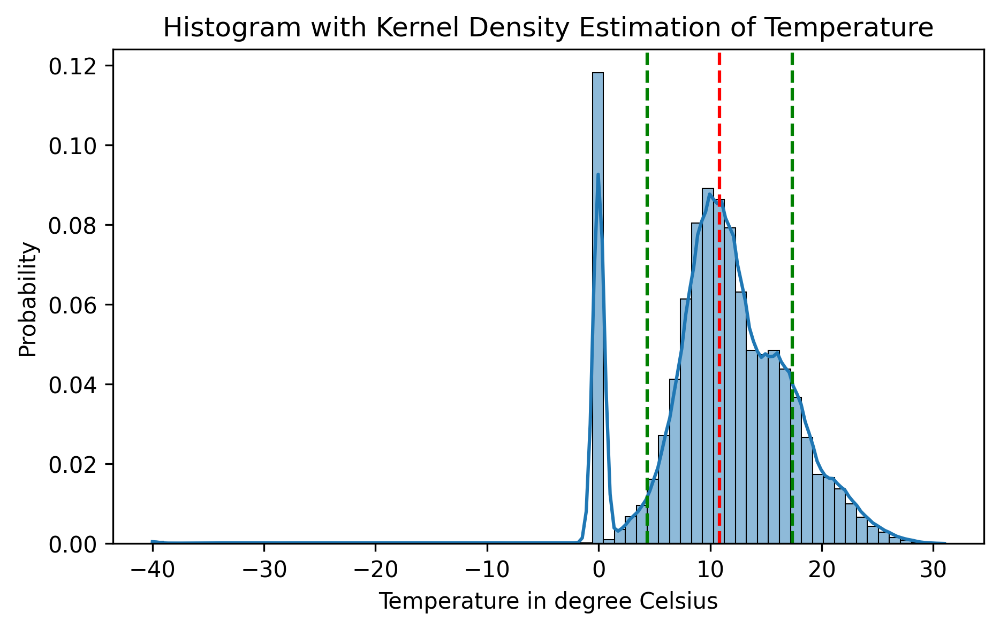

In [ ]:
# Histogram and KDE of temperature
mean_temperature = df.temparature.mean()
sd_temperature = df.temparature.std()
range_temperature = max(df.temparature)-min(df.temparature)
print(f'The mean of temperature is: {round(mean_temperature,3)} and the standard deviation of temperature is: {round(sd_temperature,3)}')
print(f'The range of temperature is: {range_temperature}')
plt.figure(figsize = (7,4), dpi = 300)
sns.histplot(df['temparature'], kde = True, bins=72, stat = 'density')
plt.axvline(mean_temperature, color='r', linestyle = '--', label='Mean')
plt.axvline(mean_temperature - sd_temperature, color='g', linestyle='--', label='Mean-std')
plt.axvline(mean_temperature + sd_temperature, color='g', linestyle='--', label='Mean+std')
plt.ylabel('Probability')
plt.xlabel('Temperature in degree Celsius')
plt.title('Histogram with Kernel Density Estimation of Temperature')
plt.savefig('06_Histogram with Kernel Density Estimation of Temperature', dpi = 300, pad_inches=0)
plt.show();

The mean of irTemperature is: 14.719 and the standard deviation of irTemperature is: 15.455
The range of irTemperature is: 99


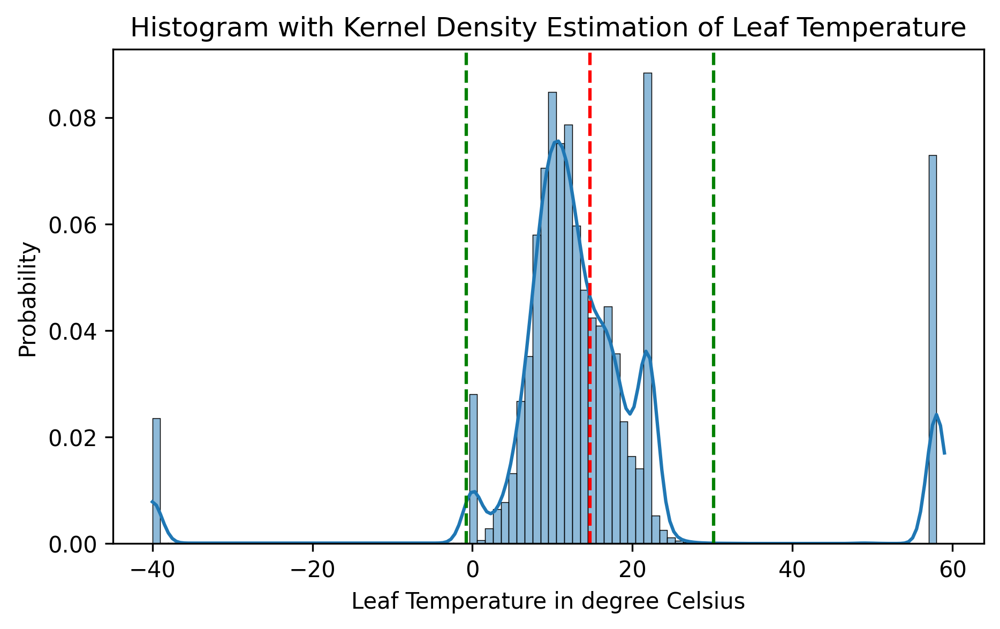

In [ ]:
# Histogram and KDE of leaf temoerature
mean_irtemperature = df.irTemparature.mean()
sd_irtemperature = df.irTemparature.std()
range_irtemperature = max(df.irTemparature)-min(df.irTemparature)
print(f'The mean of irTemperature is: {round(mean_irtemperature,3)} and the standard deviation of irTemperature is: {round(sd_irtemperature,3)}')
print(f'The range of irTemperature is: {range_irtemperature}')
plt.figure(figsize = (7,4), dpi = 300)
sns.histplot(df['irTemparature'], kde = True, bins=100, stat = 'density')
plt.axvline(mean_irtemperature, color='r', linestyle = '--', label='Mean')
plt.axvline(mean_irtemperature - sd_irtemperature, color='g', linestyle='--', label='Mean-std')
plt.axvline(mean_irtemperature + sd_irtemperature, color='g', linestyle='--', label='Mean+std')
plt.ylabel('Probability')
plt.xlabel('Leaf Temperature in degree Celsius')
plt.title('Histogram with Kernel Density Estimation of Leaf Temperature')
plt.savefig('07_Histogram with Kernel Density Estimation of Leaf Temperature', dpi = 300, pad_inches=0)
plt.show();

In [ ]:
# Clean the data removing wrong measurments by sensors
start_date = '2023-09-01'
end_date = '2023-12-31'
filtered_df = df[(df['EnqueuedTimeUtc'] >= start_date) &
                 (df['EnqueuedTimeUtc'] <= end_date) &
                 (df['humidity'] > 0) &
                 (df['irTemparature'] > 0) &
                 (df['irTemparature'] < 41) &
                 (df['temparature'] > 0) &
                 (~df['deviceId'].isin(['2908FDA']))]

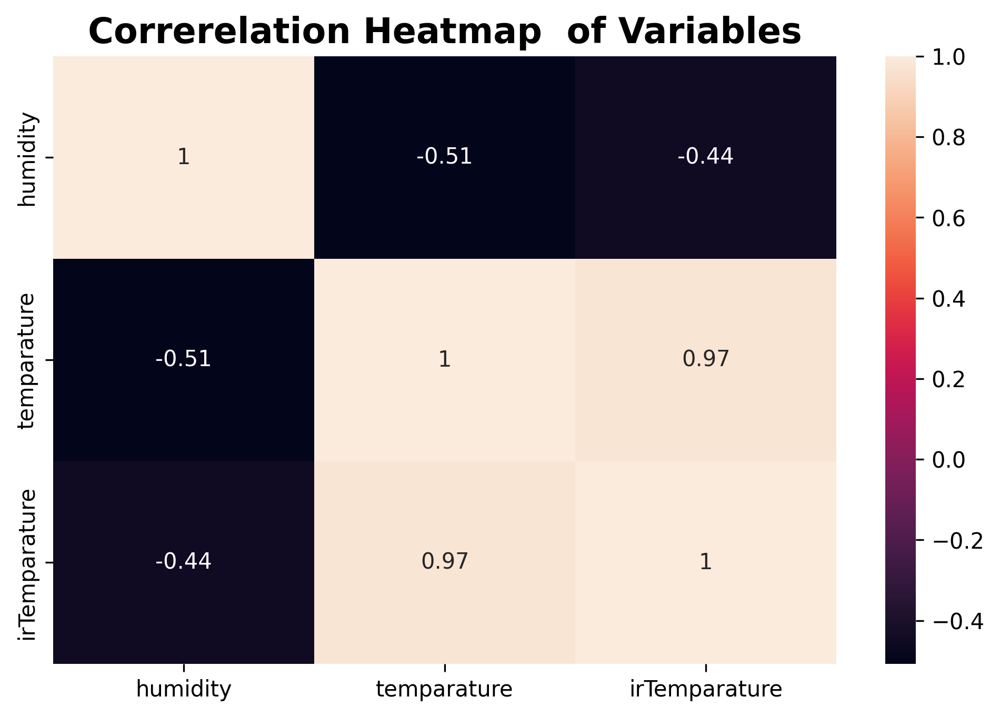

In [ ]:
# Correlation heatmap of variables
df_corr = filtered_df.drop('EnqueuedTimeUtc',axis = 1)
df_corr = df_corr.drop('deviceId', axis=1)
corr=df_corr.corr()
plt.figure(figsize = (8,5), dpi=300)
sns.heatmap(corr, annot = True)
plt.title('Correrelation Heatmap  of Variables', fontsize = 16, weight = 'bold')
plt.savefig('08_Correrelation Heatmap of Variables', dpi=300, pad_inches=0)
plt.show();

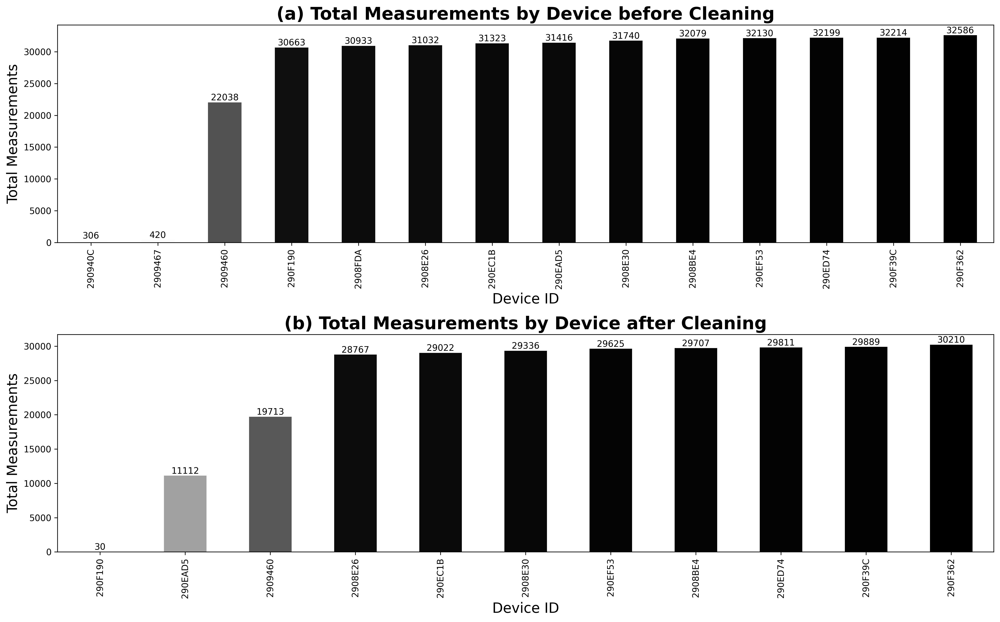

In [ ]:
# Comparison of measurment by device before and after cleaning
df_device_measurements = df.groupby('deviceId').size().sort_values()
filtered_device_measurements = filtered_df.groupby('deviceId').size().sort_values()
fig, axes = plt.subplots(2, 1, figsize=(16, 10), dpi=300)
color_map_df = plt.cm.gray_r(df_device_measurements / df_device_measurements.max())
df_device_measurements.plot(kind='bar', color=color_map_df, ax=axes[0])
axes[0].set_title('(a) Total Measurements by Device before Cleaning', fontsize=20, weight='bold')
axes[0].set_xlabel('Device ID', fontsize=16)
axes[0].set_ylabel('Total Measurements', fontsize=16)
for index, value in enumerate(df_device_measurements):
    axes[0].text(index, value, str(value), ha='center', va='bottom')

color_map_filtered = plt.cm.gray_r(filtered_device_measurements / filtered_device_measurements.max())
filtered_device_measurements.plot(kind='bar', color=color_map_filtered, ax=axes[1])
axes[1].set_title('(b) Total Measurements by Device after Cleaning', fontsize=20, weight='bold')
axes[1].set_xlabel('Device ID', fontsize=16)
axes[1].set_ylabel('Total Measurements', fontsize=16)
for index, value in enumerate(filtered_device_measurements):
    axes[1].text(index, value, str(value), ha='center', va='bottom')
plt.tight_layout()
plt.savefig('09_Measurent by device')
plt.show()

In [ ]:
# Calculate mean humidity temperature and leaf temperature for each day
morning_interval = (filtered_df['EnqueuedTimeUtc'].dt.hour >= 6) & (filtered_df['EnqueuedTimeUtc'].dt.hour < 18)
night_interval = ~morning_interval

daily_mean_humidity_day = filtered_df[morning_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['humidity'].mean()
daily_mean_humidity_night = filtered_df[night_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['humidity'].mean()

daily_mean_temperature_day = filtered_df[morning_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['temparature'].mean()
daily_mean_temperature_night = filtered_df[night_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['temparature'].mean()

daily_mean_leaf_day = filtered_df[morning_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['irTemparature'].mean()
daily_mean_leaf_night = filtered_df[night_interval].groupby(filtered_df['EnqueuedTimeUtc'].dt.date)['irTemparature'].mean()

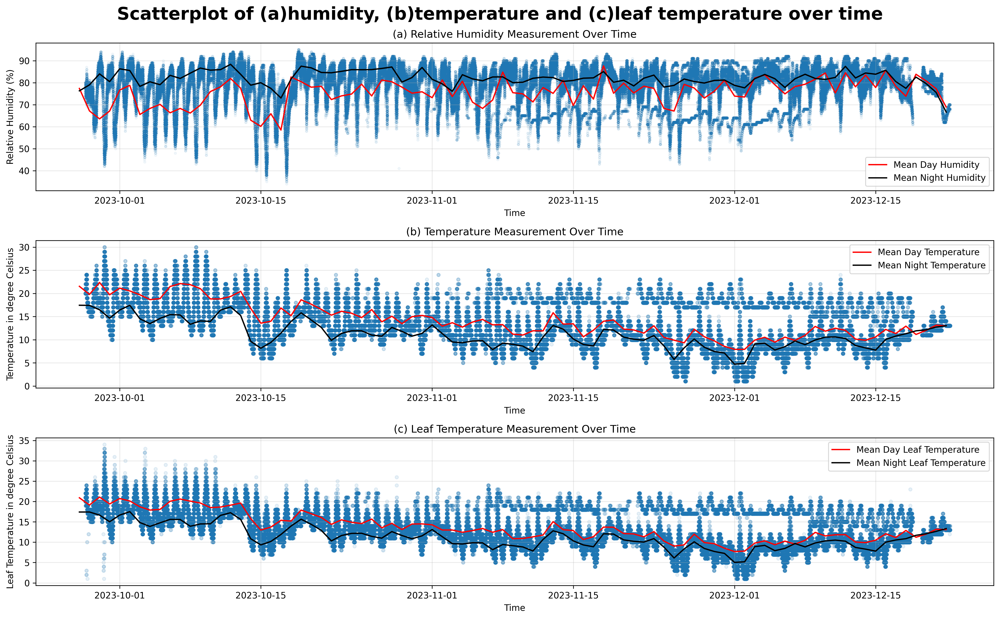

In [ ]:
# Scatterplot of humidity temperature leaf temperature over time along with mean curves
plt.figure(figsize=(16, 10), dpi=300)

plt.subplot(3, 1, 1)
plt.scatter(x=filtered_df['EnqueuedTimeUtc'], y=filtered_df['humidity'], s=7, alpha=0.05)
plt.plot(daily_mean_humidity_day.index, daily_mean_humidity_day, color='red', label='Mean Day Humidity')
plt.plot(daily_mean_humidity_night.index, daily_mean_humidity_night, color='black', label='Mean Night Humidity')
plt.title('(a) Relative Humidity Measurement Over Time')
plt.xlabel('Time')
plt.ylabel('Relative Humidity (%)')
plt.grid(alpha=0.3)
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(x=filtered_df['EnqueuedTimeUtc'], y=filtered_df['temparature'], s=14, alpha=0.1)
plt.plot(daily_mean_temperature_day.index, daily_mean_temperature_day, color='red', label='Mean Day Temperature')
plt.plot(daily_mean_temperature_night.index, daily_mean_temperature_night, color='black', label='Mean Night Temperature')
plt.title('(b) Temperature Measurement Over Time')
plt.xlabel('Time')
plt.ylabel('Temperature in degree Celsius')
plt.grid(alpha=0.3)
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(x=filtered_df['EnqueuedTimeUtc'], y=filtered_df['irTemparature'], s=14, alpha=0.1)
plt.plot(daily_mean_leaf_day.index, daily_mean_leaf_day, color='red', label='Mean Day Leaf Temperature')
plt.plot(daily_mean_leaf_night.index, daily_mean_leaf_night, color='black', label='Mean Night Leaf Temperature')
plt.title('(c) Leaf Temperature Measurement Over Time')
plt.xlabel('Time')
plt.ylabel('Leaf Temperature in degree Celsius')
plt.grid(alpha=0.3)
plt.legend()

plt.suptitle('Scatterplot of (a)humidity, (b)temperature and (c)leaf temperature over time', fontsize = 20, weight = 'bold')
plt.tight_layout()
plt.savefig('10_Measurement Over Time', dpi=300, pad_inches=0)
plt.show();

In [ ]:
# Some key statistics
morning_interval = (filtered_df['EnqueuedTimeUtc'].dt.hour >= 0) & (filtered_df['EnqueuedTimeUtc'].dt.hour < 8)
day_interval = (filtered_df['EnqueuedTimeUtc'].dt.hour >= 8) & (filtered_df['EnqueuedTimeUtc'].dt.hour < 18)
night_interval = ~(morning_interval | day_interval)
temp_stats = {
    'Interval': ['00:00-08:00', '08:00-18:00', '18:00-00:00'],
    'Mean Temperature': [
        round(filtered_df[morning_interval]['temparature'].mean(), 3),
        round(filtered_df[day_interval]['temparature'].mean(), 3),
        round(filtered_df[night_interval]['temparature'].mean(), 3)
    ],
    'Standard Deviation': [
        round(filtered_df[morning_interval]['temparature'].std(), 3),
        round(filtered_df[day_interval]['temparature'].std(), 3),
        round(filtered_df[night_interval]['temparature'].std(), 3)
    ]
}
temp_stats_df = pd.DataFrame(temp_stats)
temp_stats_df

,Interval,Mean Temperature,Standard Deviation
0,00:00-08:00,10.915,3.750
1,08:00-18:00,15.009,4.832
2,18:00-00:00,11.541,3.829


In [ ]:
# Some key statistics
min_temp = min(filtered_df['temparature'])
max_temp = max(filtered_df['temparature'])
mean_temp = filtered_df['temparature'].mean()
print(f'The temperature drop upto {min_temp} degree Celsius and peaked to {max_temp} degree Celsius')
print(f'The mean temperature is {round(mean_temp,3)}')

The temperature drop upto 1 degree Celsius and peaked to 30 degree Celsius
The mean temperature is 12.774


In [ ]:
# Filter DataFrame for temperature below 6 degrees Celsius
df_low = filtered_df[filtered_df['temparature'] < 6]

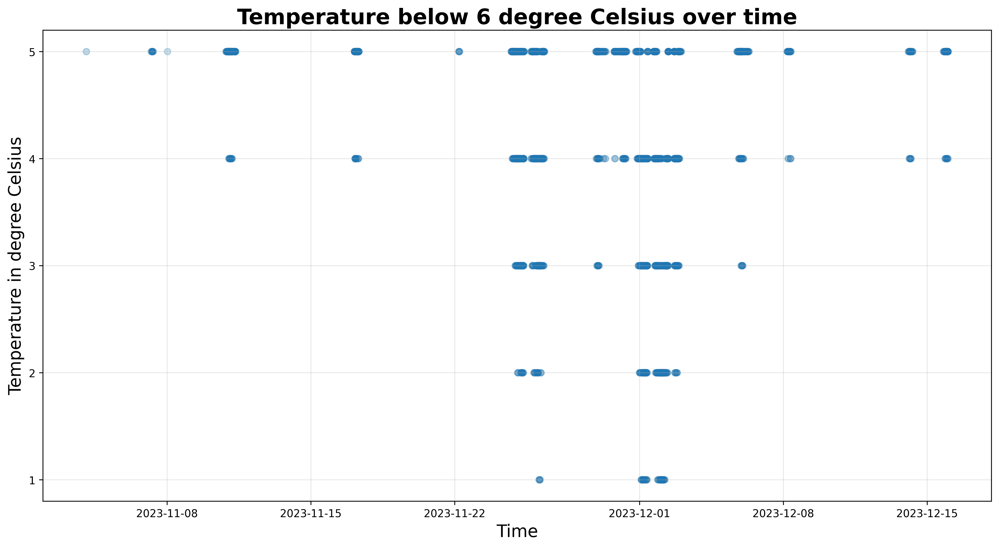

In [ ]:
# Temperature measurment over time below 6 degrees
plt.figure(figsize = (16,8), dpi=300)
plt.scatter(x=df_low.EnqueuedTimeUtc, y= df_low.temparature, alpha = 0.05)
plt.title('Temperature below 6 degree Celsius over time', fontsize = 20, weight = 'bold' )
plt.yticks(range(min(df_low['temparature']), max(df_low['temparature']) + 1, 1))
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Temperature in degree Celsius', fontsize = 16)
plt.grid(alpha=0.3)
plt.savefig('11_Temperature below 6 degree Celsius over time', dpi = 300, pad_inches= 0 )
plt.show();

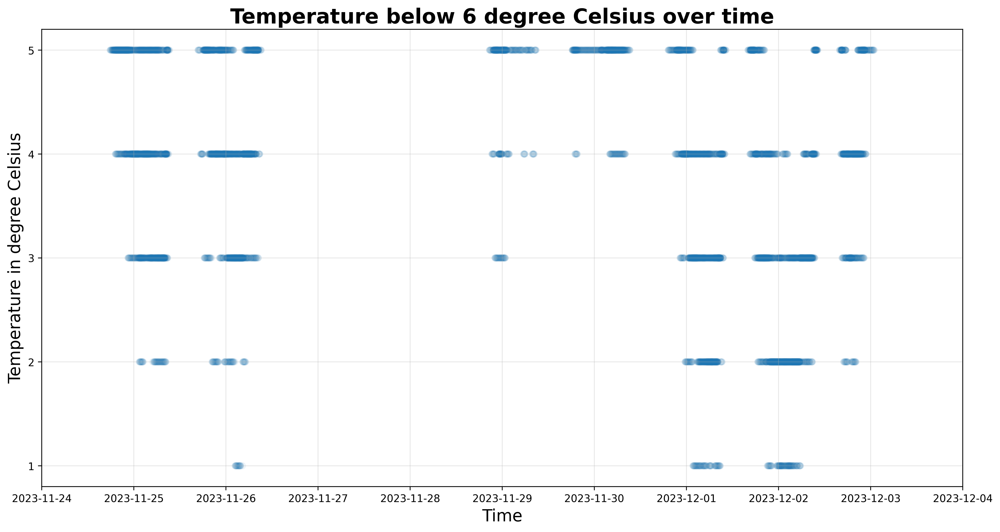

In [ ]:
# Temperature measurment over time below 6 degrees on specified time range
start, end = '2023-11-24', '2023-12-4'
plt.figure(figsize = (16,8), dpi=300)
plt.scatter(x=df_low.EnqueuedTimeUtc, y= df_low.temparature, alpha = 0.05)
plt.title('Temperature below 6 degree Celsius over time', fontsize = 20, weight = 'bold' )
plt.yticks(range(min(df_low['temparature']), max(df_low['temparature']) + 1, 1))
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Temperature in degree Celsius', fontsize = 16)
plt.xlim(pd.Timestamp(start), pd.Timestamp(end))
plt.grid(alpha=0.3)
plt.savefig('12_Temperature below 6 degree Celsius over time (zoomed in)', dpi = 300, pad_inches= 0 )
plt.show();

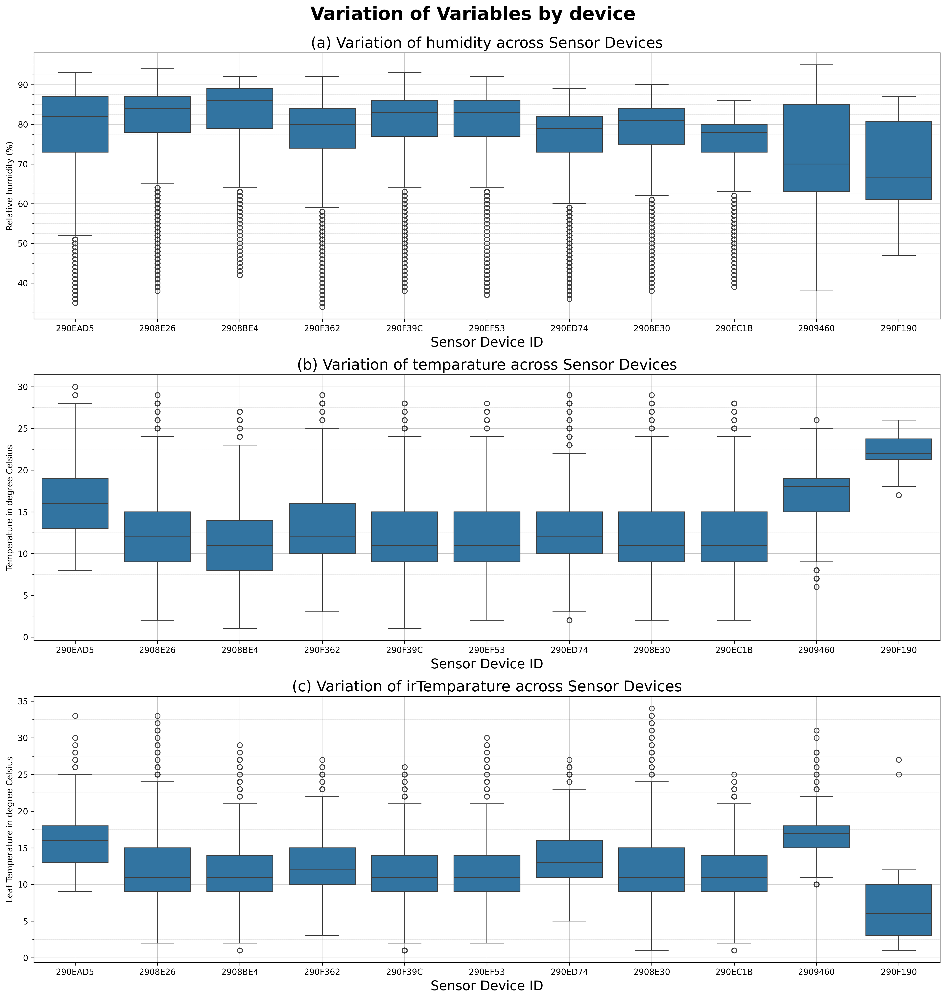

In [ ]:
# Variation of Variables by device (box plot)
variables = ['humidity','temparature', 'irTemparature']
fig, axs = plt.subplots(len(variables), 1, figsize=(16, 18), dpi=300)
number = ['(a)', '(b)', '(c)']

for i, var in enumerate(variables):
    sns.boxplot(x='deviceId', y=var, data=filtered_df, ax=axs[i])
    axs[i].set_xlabel('Sensor Device ID', fontsize = 16)
    if var == 'humidity':
      axs[i].set_ylabel('Relative humidity (%)')
    if var == 'temparature':
      axs[i].set_ylabel('Temperature in degree Celsius')
    if var == 'irTemparature':
      axs[i].set_ylabel('Leaf Temperature in degree Celsius')
    axs[i].set_title(f'{number[i]} Variation of {var} across Sensor Devices', fontsize = 18)
    axs[i].grid(which='both', linestyle='-', linewidth='0.1', color='black', alpha=1)
    axs[i].yaxis.set_minor_locator(MultipleLocator(2.5))
    axs[i].grid(which='minor', linestyle=':', linewidth='0.1', color='black', alpha=1)
fig.suptitle('Variation of Variables by device', fontsize=22, weight='bold')
plt.tight_layout(rect=[0, 0.05, 1, 0.985])
plt.savefig('13_Variation of Variables by device', dpi = 500, pad_inches=0)
plt.show();

In [ ]:
dev_1 = filtered_df[filtered_df['deviceId']=='290EAD5']
first_dev_1 = min(dev_1['EnqueuedTimeUtc'])
last_dev_1 = max(dev_1['EnqueuedTimeUtc'])
print(f'The device 290EAD5 first measurment was at {first_dev_1} and last measurment was at {last_dev_1}')

The device 290EAD5 first measurment was at 2023-09-27 14:29:55 and last measurment was at 2023-10-28 19:25:17


In [ ]:
dev_2 = filtered_df[filtered_df['deviceId']=='2909460']
first_dev_2 = min(dev_2['EnqueuedTimeUtc'])
last_dev_2 = max(dev_2['EnqueuedTimeUtc'])
median_humidity= np.median(dev_2['humidity'])
median_temp= np.median(dev_2['temparature'])
median_leaf= np.median(dev_2['irTemparature'])
print(f'The device 290EAD5 first measurment was at {first_dev_2} and last measurment was at {last_dev_2}')
print(f'The median humidity is {median_humidity}')
print(f'The median temperature is {median_temp}')
print(f'The median leaf temperature is {median_leaf}')

The device 290EAD5 first measurment was at 2023-09-27 15:42:03 and last measurment was at 2023-12-21 14:13:59
The median humidity is 70.0
The median temperature is 18.0
The median leaf temperature is 17.0


In [ ]:
dev_2_day = (dev_2['EnqueuedTimeUtc'].dt.hour >= 8) & (filtered_df['EnqueuedTimeUtc'].dt.hour < 18)
dev_2_night = ~dev_2_day
len(dev_2_day), len(dev_2_night)

(267222, 267222)